In [19]:
!git clone https://github.com/Astrid-Lubang/MeXE402_FINALS_-LUBANGASTRIDCLAIRE_MUNOZFLORIANE.git
%cd MeXE402_FINALS_-LUBANGASTRIDCLAIRE_MUNOZFLORIANE/
from IPython.display import clear_output
clear_output()

#  Part 1: OpenCV Basics

### Lesson 1: Changing Image's Color Profile

(981, 736, 3)


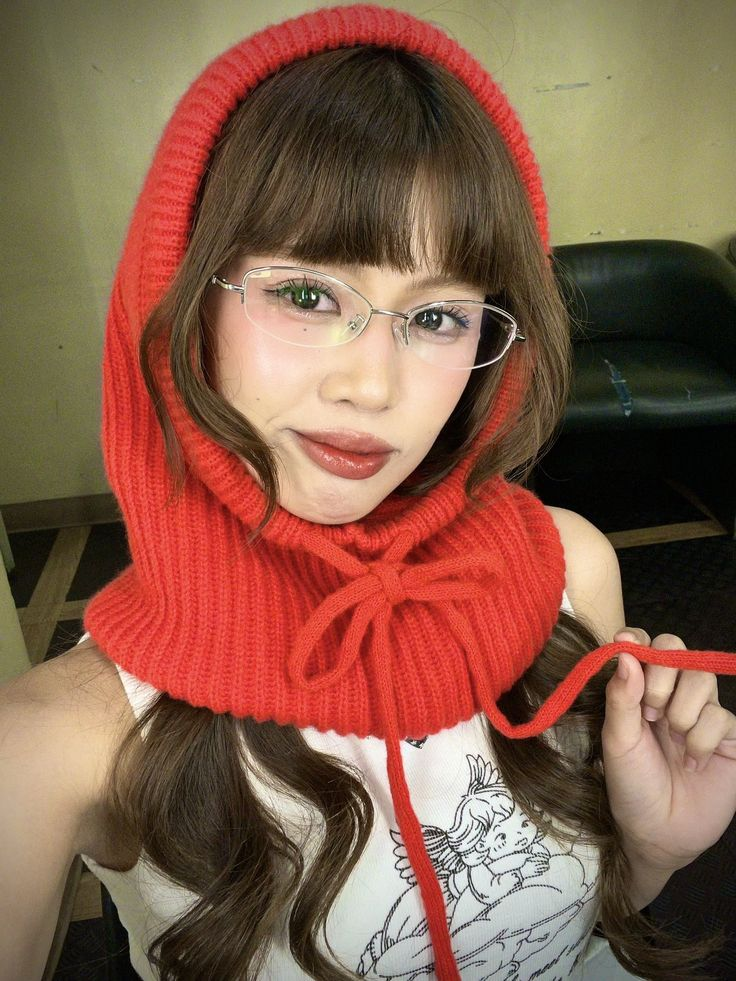

In [20]:
import cv2
from google.colab.patches import cv2_imshow

#colorful image - 3 channels
# Correct the file path to the image
BINI = cv2.imread('PART 1/IMAGES/Color_Profile.jpg')
print(BINI.shape)
cv2_imshow(BINI)


(981, 736)


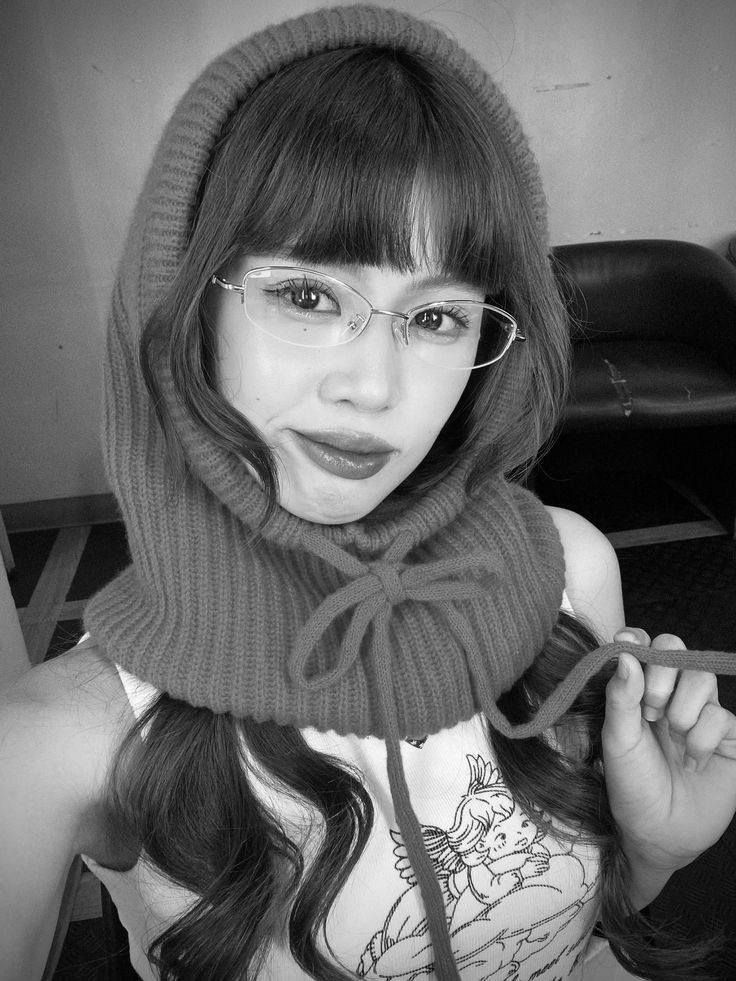

In [21]:
#grayscale image
gray = cv2.cvtColor(BINI,cv2.COLOR_BGR2GRAY)
print(gray.shape)
cv2_imshow(gray)

(981, 736, 3)


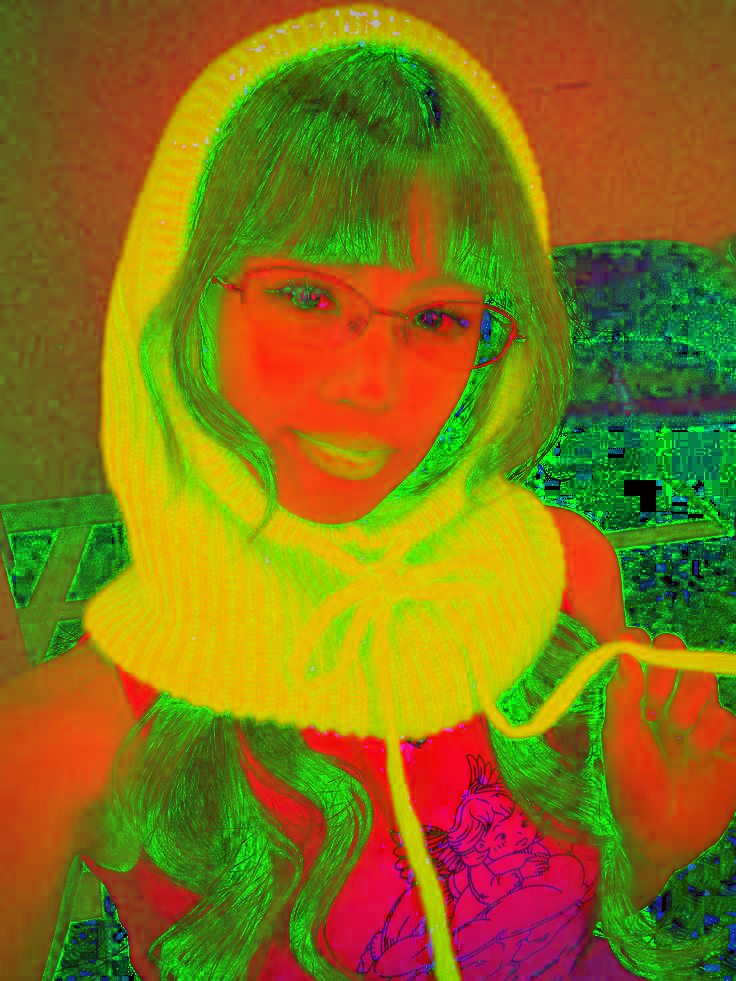

In [22]:
#HSV  IMAGE
HSV = cv2.cvtColor(BINI, cv2.COLOR_BGR2HSV)
print(HSV.shape)
cv2_imshow(HSV)

Lesson 2: Edge Detection

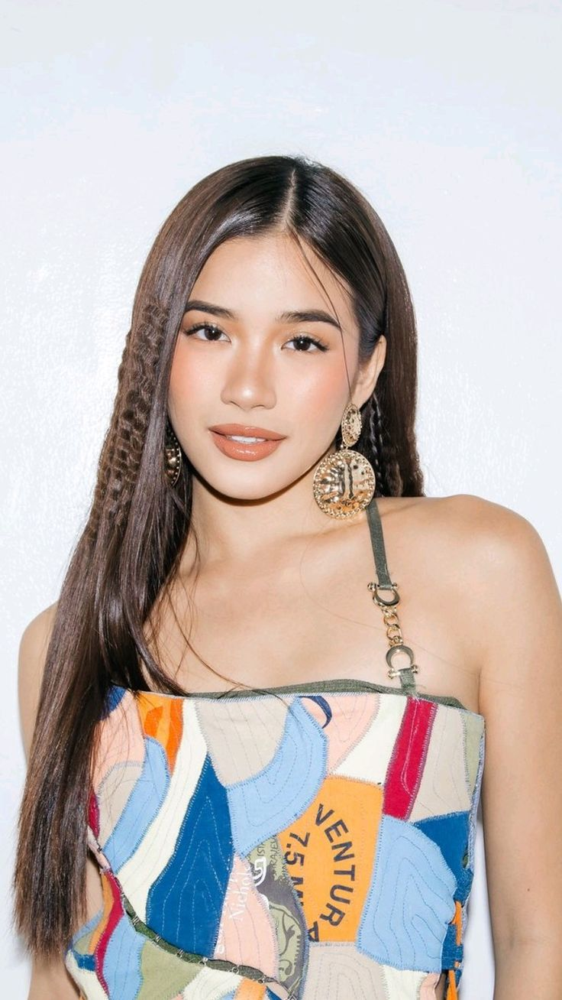

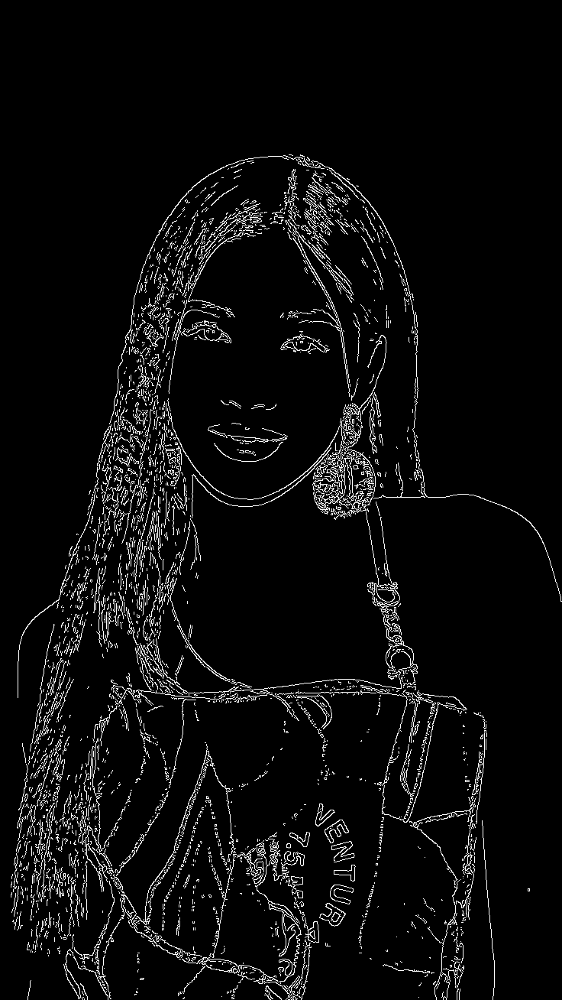

In [23]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

AIAH= cv2.imread('PART 1/IMAGES/EDGE_DETECTION.jpg')
cv2_imshow(AIAH)

gray = cv2.cvtColor(AIAH,cv2.COLOR_BGR2GRAY)
canny_image = cv2.Canny(gray,150, 200)
cv2_imshow(canny_image)


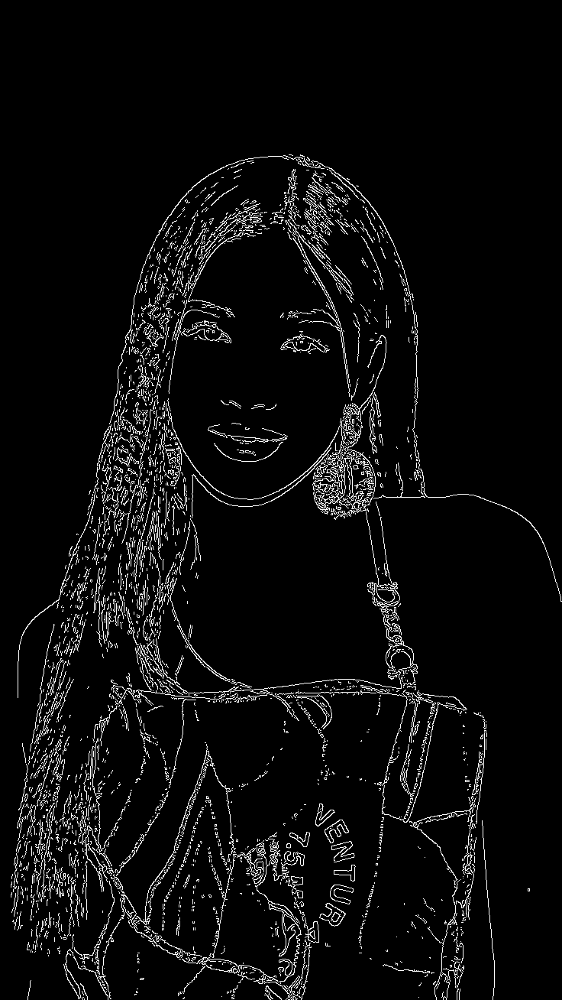

In [24]:
# Erosion
kernel = np.ones((5,5), np.uint8)
#Erosion
kernel = np.ones((1,1), np.uint8)
erode_image = cv2.erode(canny_image,kernel, iterations=1)
cv2_imshow(erode_image)


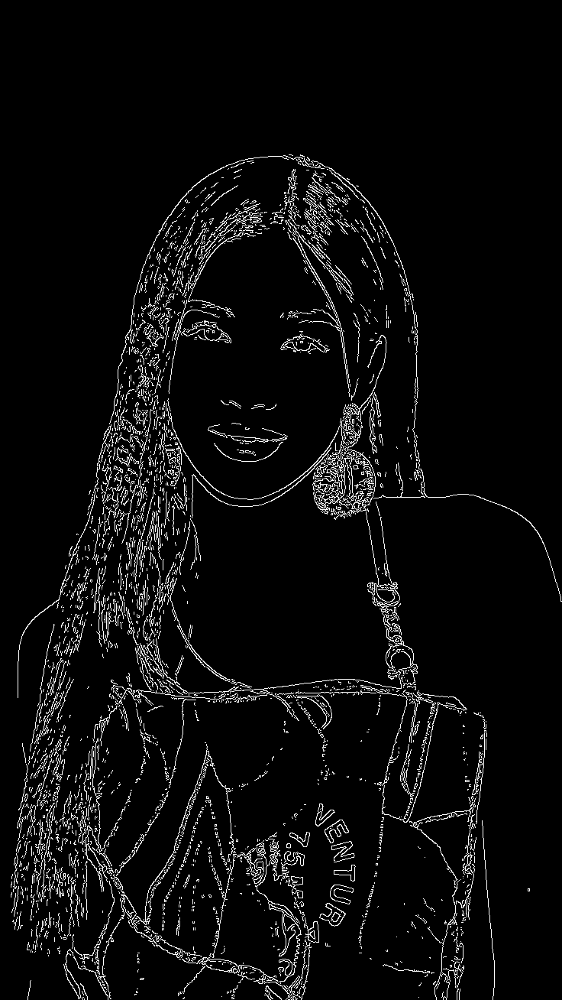

In [25]:
#Dilation
dilate_image = cv2.dilate(canny_image, kernel, iterations=1)
cv2_imshow(dilate_image)

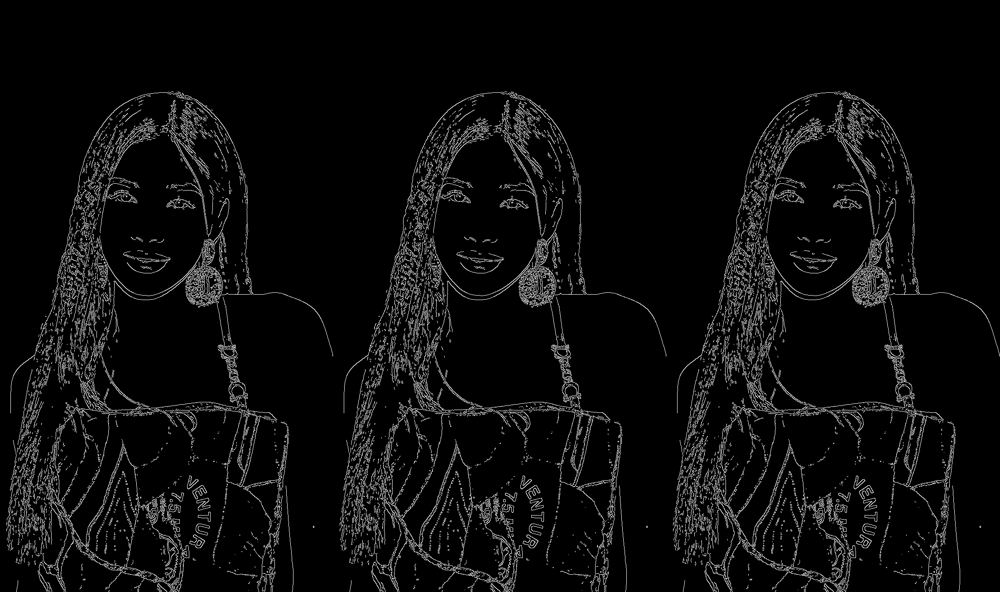

In [26]:
display = np.hstack((canny_image,dilate_image,erode_image))
cv2_imshow(display)

 Lesson 3: Image Manipulation

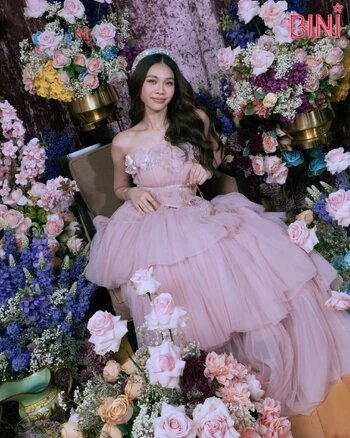

In [27]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

STACEY = cv2.imread("PART 1/IMAGES/IMAGE_MANIPULATION.jpg")
cv2_imshow(STACEY)

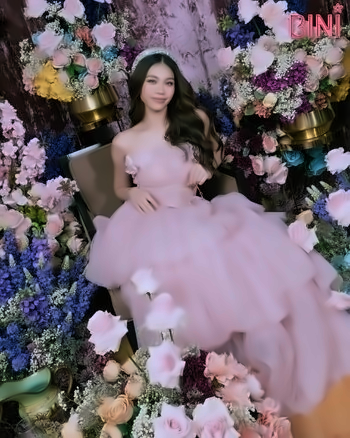

In [28]:
dst = cv2.fastNlMeansDenoisingColored(STACEY, None, 10, 10, 7, 10)
cv2_imshow(dst)


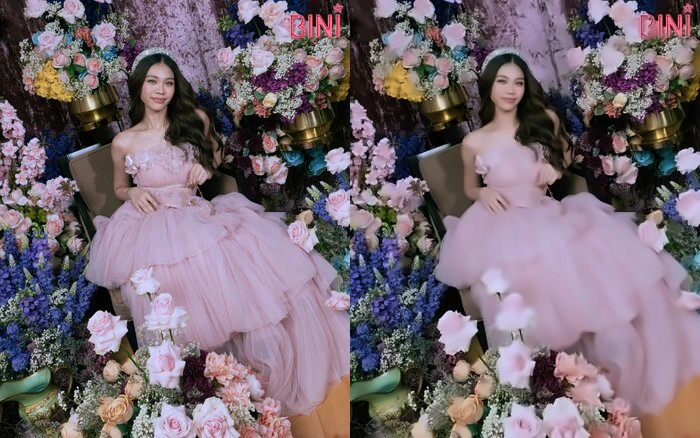

In [29]:
display = np.hstack((STACEY, dst))
cv2_imshow(display)

Lesson 4: Drawing Shapes and Writing Text Images

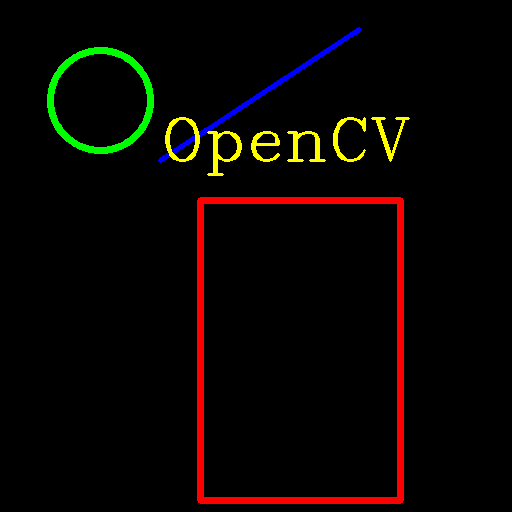

In [30]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = np.zeros((512, 512, 3), np.uint8)
#uint8: 0 to 255

# Drawing Function
# Draw a Circle
cv2.circle(img, (100,100), 50, (0,255,0),5)
# Draw a Rectangle
cv2.rectangle(img,(200,200),(400,500),(0,0,255),5)
#Draw a Line
cv2.line(img, (160,160),(359,29),(255,0,0),3)
#Write a Text
cv2.putText(img,"OpenCV",(160,160),cv2.FONT_HERSHEY_COMPLEX,2,(0,255,255),2)
# Displaying the Image
cv2_imshow(img)

# Part 2: Intermediate Exercises
Lesson 1: Color Detection



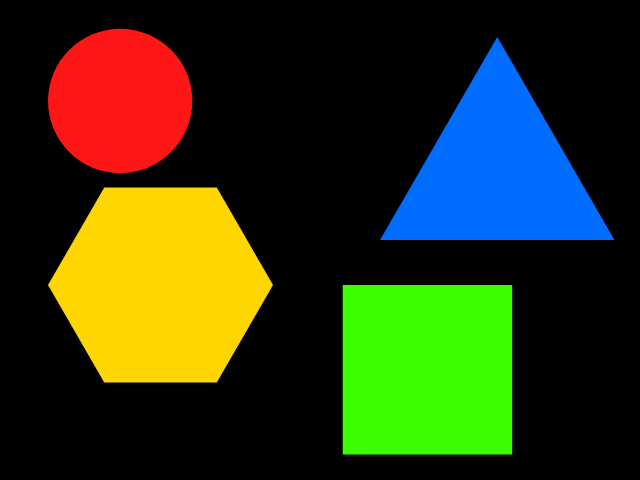

In [31]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
#BGR Image . It is represented in Blue, Green and Red Channels...
image = cv2.imread("PART 1/IMAGES/SHAPES.png")
cv2_imshow(image)


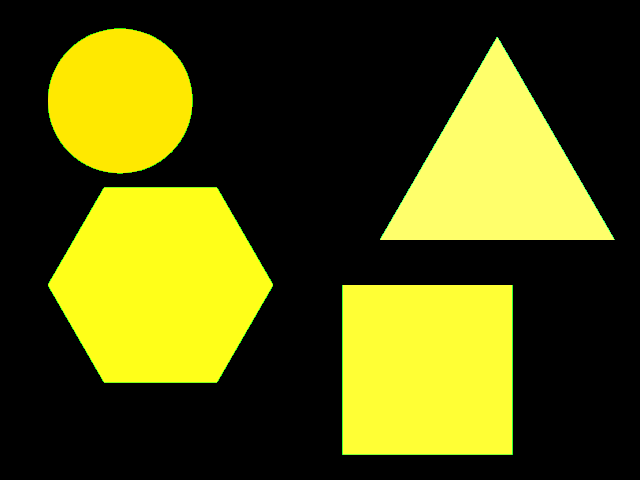

In [32]:
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
cv2_imshow(hsv)


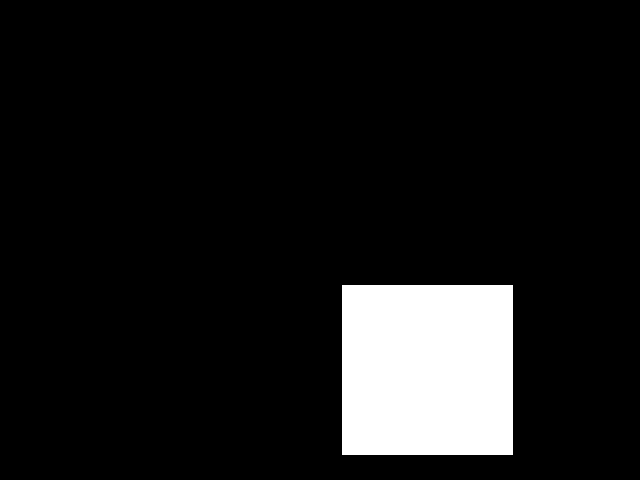

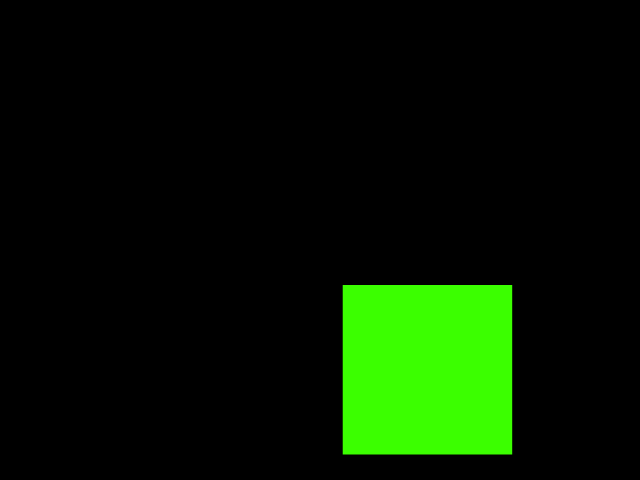

In [35]:
# Blue Color Triangle
# lower_hue = np.array([65,0,0])
# upper_hue = np.array([110, 255,255])

# Red Color
# lower_hue = np.array([0,0,0])
# upper_hue = np.array([20,255, 255])

# Green Color
lower_hue = np.array([46,0,0])
upper_hue = np.array([91,255,255])

# Yellow Color
#lower_hue = np.array([21,0,0])
#upper_hue = np.array([45,255,255])

mask = cv2.inRange(hsv,lower_hue,upper_hue)
cv2_imshow(mask)

result = cv2.bitwise_and(image, image, mask = mask)
cv2_imshow(result)
# cv2_imshow(image)

Lesson 2: Face Detection

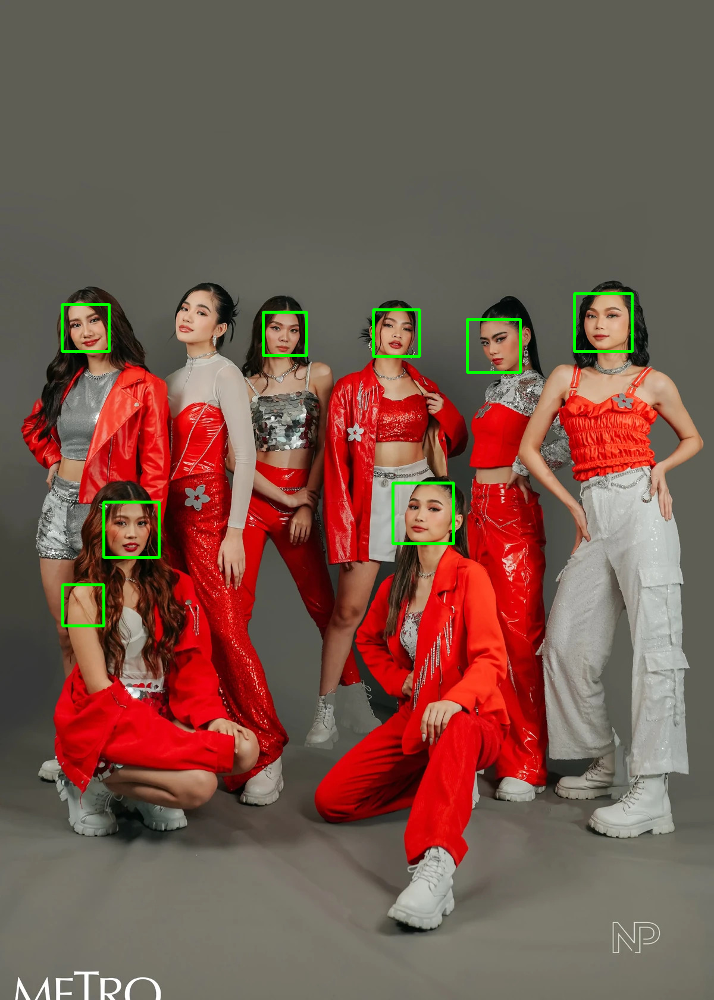

In [36]:
import cv2
from google.colab.patches import cv2_imshow

face_cascade = cv2.CascadeClassifier("PART 1/FILES/haarcascade_frontalface_default.xml")
img = cv2.imread("PART 1/IMAGES/FACE_DETECTION.jpg")
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray,1.3,5)
# print(faces)
for (x,y,w,h) in faces:
  cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),3)

cv2_imshow(img)


Lesson 3: Shape Detection

We found a square
We have a hexagon here
We found a triangle
We found a circle
We found a square


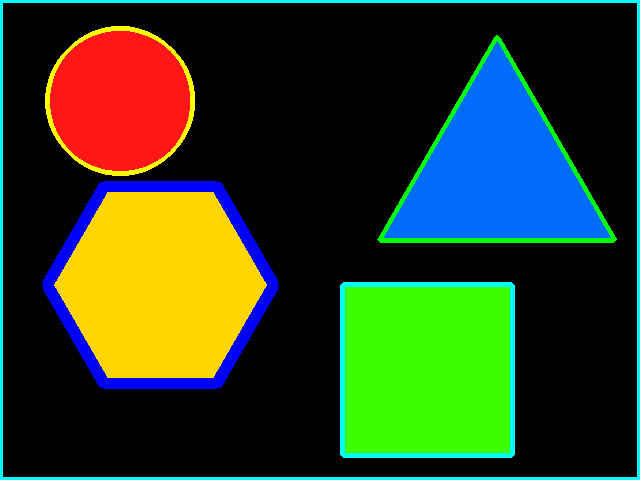

In [37]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread("PART 1/IMAGES/SHAPES.png")
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

ret, thresh = cv2.threshold(gray,50,255,1)
contours,h = cv2.findContours(thresh,1,2)
# cv2_imshow(thresh)
for cnt in contours:
  approx = cv2.approxPolyDP(cnt,0.01*cv2.arcLength(cnt,True),True)
  n = len(approx)
  if n==6:
    # this is a hexagon
    print("We have a hexagon here")
    cv2.drawContours(img,[cnt],0,255,10)
  elif n==3:
    # this is a triangle
    print("We found a triangle")
    cv2.drawContours(img,[cnt],0,(0,255,0),3)
  elif n>9:
    # this is a circle
    print("We found a circle")
    cv2.drawContours(img,[cnt],0,(0,255,255),3)
  elif n==4:
    # this is a Square
    print("We found a square")
    cv2.drawContours(img,[cnt],0,(255,255,0),3)
cv2_imshow(img)

# PART 3: PROJECTS
Project 1: Tracking Ball

In [38]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

ball = []
cap = cv2.VideoCapture("PART 1/VIDEO/video.mp4")
out = cv2.VideoWriter('output.avi',cv2.VideoWriter_fourcc('M','J','P','G'),10,(1920,1080))
while cap.isOpened():
  ret, frame = cap.read()
  if ret is False:
    break
  hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
  lower_hue = np.array([21,0,0])
  upper_hue = np.array([45,255,255])
  mask = cv2.inRange(hsv,lower_hue, upper_hue)

  (contours,_)=cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

  center = None

  if len(contours)>0:
    c = max(contours, key=cv2.contourArea)
    ((x,y),radius) = cv2.minEnclosingCircle(c)
    M = cv2.moments(c)
    try:
      cv2.circle(frame, center,10, (255,0,0),-1)
      ball.append(center)
    except:
      pass
    if len(ball)>2:
      for i in range(1,len(ball)):
        cv2.line(frame, ball[i-1], ball[i],(0,0,255),5)
  out.write(frame)
out.release()

Project 2: Face Recognition

In [39]:
!git clone  https://github.com/misbah4064/face_recognition.git
!pip install face_recognition
%cd face_recognition

Cloning into 'face_recognition'...
remote: Enumerating objects: 26, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 26 (delta 5), reused 23 (delta 3), pack-reused 0 (from 0)
Receiving objects: 100% (26/26), 3.03 MiB | 6.30 MiB/s, done.
Resolving deltas: 100% (5/5), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 8.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566162 sha256=7e23704a4e461b8b4055e4838ad2805d46890ba24d0c560db648604c251b22eb
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models
/content/MeXE402_FINALS_-LUBANGASTRIDCLAIRE_MUNOZFLORIANE/face_recognition


In [40]:
# Create Encoding Profiles using known face images


In [41]:
import face_recognition
import numpy as np
from google.colab.patches import cv2_imshow
import cv2

# Creating the encoding profiles
face_1 = face_recognition.load_image_file("elon.jpg")
face_1_encoding = face_recognition.face_encodings(face_1)[0]

face_2 = face_recognition.load_image_file("Donald Trump.jpg")
face_2_encoding = face_recognition.face_encodings(face_2)[0]

face_3 = face_recognition.load_image_file("jeffbezos.jpg")
face_3_encoding = face_recognition.face_encodings(face_3)[0]

known_face_encodings = [
                        face_1_encoding,
                        face_2_encoding,
                        face_3_encoding
]

known_face_names = [
                    "Elon Musk",
                    "Donald Trump",
                    "Jeff Bezos"
]

In [42]:
# Run Face Recognition on unknown faces

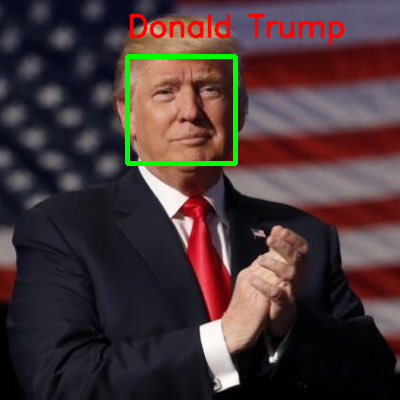

In [43]:
file_name = "unknown_do.jpg"
unknown_image = face_recognition.load_image_file(file_name)
unknown_image_to_draw = cv2.imread(file_name)

face_locations = face_recognition.face_locations(unknown_image)
face_encodings = face_recognition.face_encodings(unknown_image, face_locations)

for (top,right, bottom, left), face_encoding in zip(face_locations, face_encodings):
  matches = face_recognition.compare_faces(known_face_encodings, face_encoding)

  name = "Unknown"

  face_distances = face_recognition.face_distance(known_face_encodings, face_encoding)
  best_match_index = np.argmin(face_distances)
  if matches[best_match_index]:
    name = known_face_names[best_match_index]
  cv2.rectangle(unknown_image_to_draw, (left, top), (right, bottom),(0,255,0),3)
  cv2.putText(unknown_image_to_draw,name, (left, top-20), cv2.FONT_HERSHEY_SIMPLEX,1,(0,0,255),2, cv2.LINE_AA)

cv2_imshow(unknown_image_to_draw)

In [44]:
# Applying Image Blurring Techniques

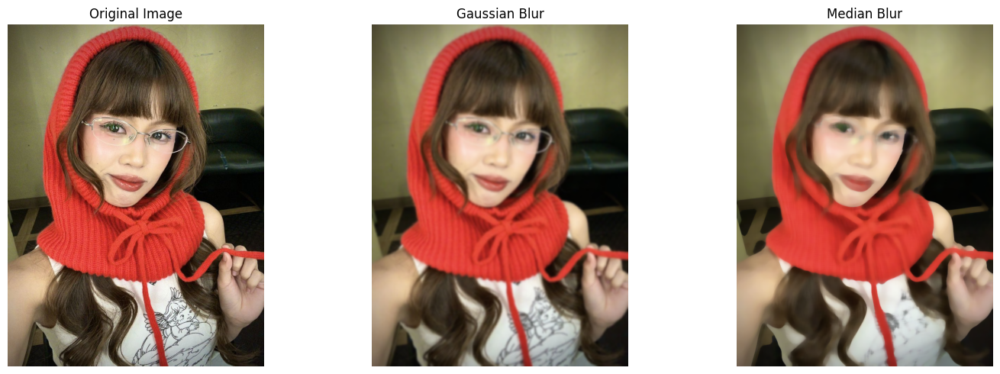

In [45]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt

# Load your image
image = cv2.imread('/content/MeXE402_FINALS_-LUBANGASTRIDCLAIRE_MUNOZFLORIANE/PART 1/IMAGES/Color_Profile.jpg')

# Apply Gaussian blur
gaussian_blur = cv2.GaussianBlur(image, (15, 15), 0)

# Apply Median blur
median_blur = cv2.medianBlur(image, 15)

# Display the original and blurred images side by side
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Gaussian Blur")
plt.imshow(cv2.cvtColor(gaussian_blur, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Median Blur")
plt.imshow(cv2.cvtColor(median_blur, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

In [46]:
# Segmenting Images Based on Contours

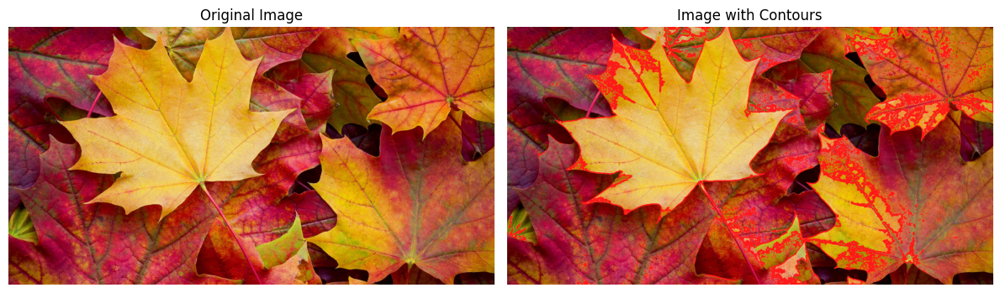

In [56]:
# Importing necessary libraries to process the image and detect contours
import cv2
import matplotlib.pyplot as plt

# Load the uploaded image
image_path = '/content/MeXE402_FINALS_-LUBANGASTRIDCLAIRE_MUNOZFLORIANE/PART 1/IMAGES/Leaves.webp'
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert the image to grayscale for contour detection
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, binary_image = cv2.threshold(gray_image, 150, 300, cv2.THRESH_BINARY)

# Detect contours in the binary image
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw the contours on the original image
contoured_image = image_rgb.copy()
cv2.drawContours(contoured_image, contours, -5, (255, 25, 25), 3)

# Display the original image and the contoured image
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(image_rgb)
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(contoured_image)
axes[1].set_title("Image with Contours")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [47]:
# Combining Erosion and Dilation for Feature Refinement

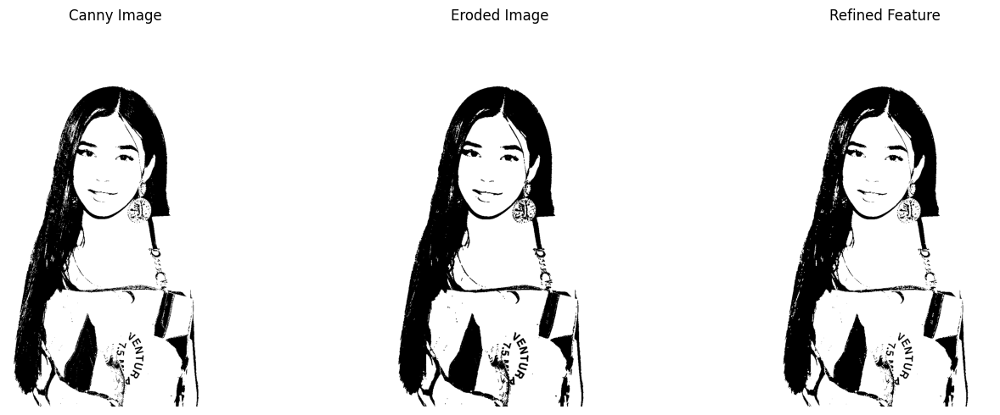

In [52]:
# Importing necessary libraries to process the image and detect contours
import cv2
import numpy as np
import matplotlib.pyplot as plt

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = '/content/MeXE402_FINALS_-LUBANGASTRIDCLAIRE_MUNOZFLORIANE/PART 1/IMAGES/EDGE_DETECTION.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply binary threshold
_, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Define a kernel (structuring element)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))

# Apply Erosion
eroded_image = cv2.erode(binary_image, kernel, iterations=1)

# Apply Dilation (after Erosion)
dilated_image = cv2.dilate(eroded_image, kernel, iterations=1)

# Plot the results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(binary_image, cmap='gray')
axes[0].set_title("Canny Image")
axes[0].axis("off")

axes[1].imshow(eroded_image, cmap='gray')
axes[1].set_title("Eroded Image")
axes[1].axis("off")

axes[2].imshow(dilated_image, cmap='gray')
axes[2].set_title("Refined Feature")
axes[2].axis("off")

plt.tight_layout()
plt.show()


